# You Only Look Once (YOLO)

### Introduction

As you learned in the previous lessons, YOLO is a state-of-the-art, real-time object detection algorithm. In this notebook, we will apply the YOLO algorithm to detect objects in images. We have provided a series of images that you can test the YOLO algorithm on. Below is a list of the available images that you can load:

* cat.jpg
* city_scene.jpg
* dog.jpg
* dog2.jpg
* eagle.jpg
* food.jpg
* giraffe.jpg
* horses.jpg
* motorbike.jpg
* person.jpg
* surf.jpg
* wine.jpg

These images are located in the`./images/`folder. We encourage you to test the YOLO algorithm on your own images as well. Have fun!

In [19]:
ims = !ls ./images
ims

['cat.jpg',
 'city_scene.jpg',
 'dog2.jpg',
 'dog.jpg',
 'eagle.jpg',
 'food.jpg',
 'giraffe.jpg',
 'horses.jpg',
 'motorbike.jpg',
 'person.jpg',
 'surf.jpg',
 'wine.jpg']

In [3]:
import cv2
import matplotlib.pyplot as plt

from utils import *
from darknet import Darknet

# Setting Up The Neural Network

We will be using the latest version of YOLO, known as YOLOv3. We have already downloaded the `yolov3.cfg` file that contains the network architecture used by YOLOv3 and placed it in the `/cfg/` folder. Similarly, we have placed the `yolov3.weights` file that contains the pre-trained weights in the `/weights/` directory. Finally, the `/data/` directory, contains the `coco.names` file that has the list of the 80 object classes that the weights were trained to detect.

In the code below, we start by specifying the location of the files that contain the neural network architecture, the pre-trained weights, and the object classes.  We then use *Darknet* to setup the neural network using the network architecture specified in the `cfg_file`. We then use the`.load_weights()` method to load our set of pre-trained weights into the model. Finally, we use the `load_class_names()` function, from the `utils` module, to load the 80 object classes.

In [5]:
# Set the location and name of the cfg file
cfg_file = './cfg/yolov3.cfg'

# Set the location and name of the pre-trained weights file
weight_file = './weights/yolov3.weights'

# Set the location and name of the COCO object classes file
namesfile = 'data/coco.names'

# Load the network architecture
m = Darknet(cfg_file)

# Load the pre-trained weights
m.load_weights(weight_file)

# Load the COCO object classes
class_names = load_class_names(namesfile)

In [13]:
x = !cat {namesfile}
x, len(x)

(['person',
  'bicycle',
  'car',
  'motorbike',
  'aeroplane',
  'bus',
  'train',
  'truck',
  'boat',
  'traffic light',
  'fire hydrant',
  'stop sign',
  'parking meter',
  'bench',
  'bird',
  'cat',
  'dog',
  'horse',
  'sheep',
  'cow',
  'elephant',
  'bear',
  'zebra',
  'giraffe',
  'backpack',
  'umbrella',
  'handbag',
  'tie',
  'suitcase',
  'frisbee',
  'skis',
  'snowboard',
  'sports ball',
  'kite',
  'baseball bat',
  'baseball glove',
  'skateboard',
  'surfboard',
  'tennis racket',
  'bottle',
  'wine glass',
  'cup',
  'fork',
  'knife',
  'spoon',
  'bowl',
  'banana',
  'apple',
  'sandwich',
  'orange',
  'broccoli',
  'carrot',
  'hot dog',
  'pizza',
  'donut',
  'cake',
  'chair',
  'sofa',
  'pottedplant',
  'bed',
  'diningtable',
  'toilet',
  'tvmonitor',
  'laptop',
  'mouse',
  'remote',
  'keyboard',
  'cell phone',
  'microwave',
  'oven',
  'toaster',
  'sink',
  'refrigerator',
  'book',
  'clock',
  'vase',
  'scissors',
  'teddy bear',
  'hair

# Taking a Look at The Neural Network

Now that the neural network has been setup, we can see what it looks like. We can print the network using the `.print_network()` function.

In [6]:
# Print the neural network used in YOLOv3
m.print_network()

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  32
    1 conv     64  3 x 3 / 2   416 x 416 x  32   ->   208 x 208 x  64
    2 conv     32  1 x 1 / 1   208 x 208 x  64   ->   208 x 208 x  32
    3 conv     64  3 x 3 / 1   208 x 208 x  32   ->   208 x 208 x  64
    4 shortcut 1
    5 conv    128  3 x 3 / 2   208 x 208 x  64   ->   104 x 104 x 128
    6 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64
    7 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128
    8 shortcut 5
    9 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64
   10 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128
   11 shortcut 8
   12 conv    256  3 x 3 / 2   104 x 104 x 128   ->    52 x  52 x 256
   13 conv    128  1 x 1 / 1    52 x  52 x 256   ->    52 x  52 x 128
   14 conv    256  3 x 3 / 1    52 x  52 x 128   ->    52 x  52 x 256
   15 shortcut 12
   16 conv    128  1 x 1

As we can see, the neural network used by YOLOv3 consists mainly of convolutional layers, with some shortcut connections and upsample layers. For a full description of this network please refer to the <a href="https://pjreddie.com/media/files/papers/YOLOv3.pdf">YOLOv3 Paper</a>.

# Loading and Resizing Our Images

In the code below, we load our images using OpenCV's `cv2.imread()` function. Since, this function loads images as BGR we will convert our images to RGB so we can display them with the correct colors.

As we can see in the previous cell, the input size of the first layer of the network is 416 x 416 x 3. Since images have different sizes, we have to resize our images to be compatible with the input size of the first layer in the network. In the code below, we resize our images using OpenCV's `cv2.resize()` function. We then plot the original and resized images. 

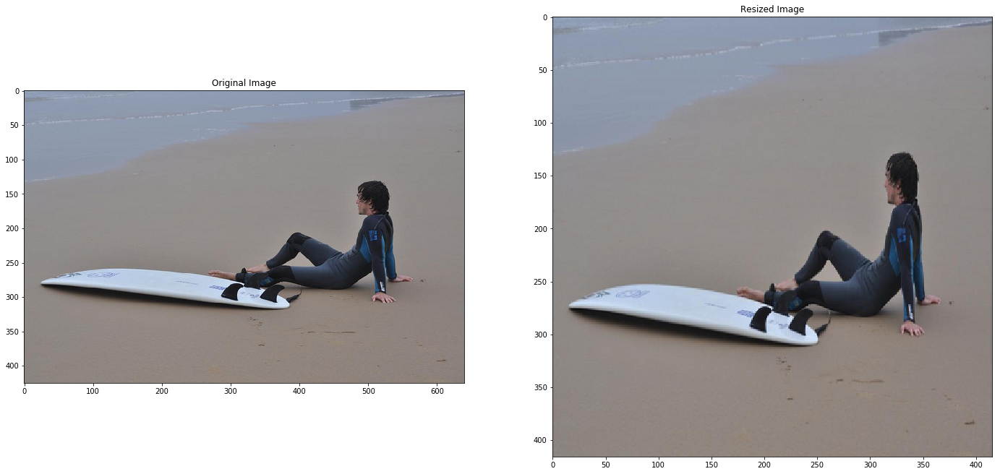

In [7]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [24.0, 14.0]

# Load the image
img = cv2.imread('./images/surf.jpg')

# Convert the image to RGB
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# We resize the image to the input width and height of the first layer of the network.    
resized_image = cv2.resize(original_image, (m.width, m.height))

# Display the images
plt.subplot(121)
plt.title('Original Image')
plt.imshow(original_image)
plt.subplot(122)
plt.title('Resized Image')
plt.imshow(resized_image)
plt.show()

# Setting the Non-Maximal Suppression Threshold

As you learned in the previous lessons, YOLO uses **Non-Maximal Suppression (NMS)** to only keep the best bounding box. The first step in NMS is to remove all the predicted bounding boxes that have a detection probability that is less than a given NMS threshold.  In the code below, we set this NMS threshold to `0.6`. This means that all predicted bounding boxes that have a detection probability less than 0.6 will be removed. 

In [8]:
# Set the NMS threshold
nms_thresh = 0.6

# Setting the Intersection Over Union Threshold

After removing all the predicted bounding boxes that have a low detection probability, the second step in NMS, is to select the bounding boxes with the highest detection probability and eliminate all the bounding boxes whose **Intersection Over Union (IOU)** value is higher than a given IOU threshold. In the code below, we set this IOU threshold to `0.4`. This means that all predicted bounding boxes that have an IOU value greater than 0.4 with respect to the best bounding boxes will be removed.

In the `utils` module you will find the `nms` function, that performs the second step of Non-Maximal Suppression, and the `boxes_iou` function that calculates the Intersection over Union of two given bounding boxes. You are encouraged to look at these functions to see how they work. 

In [9]:
# Set the IOU threshold
iou_thresh = 0.4

# Object Detection

Once the image has been loaded and resized, and you have chosen your parameters for `nms_thresh` and `iou_thresh`, we can use the YOLO algorithm to detect objects in the image. We detect the objects using the `detect_objects(m, resized_image, iou_thresh, nms_thresh)`function from the `utils` module. This function takes in the model `m` returned by *Darknet*, the resized image, and the NMS and IOU thresholds, and returns the bounding boxes of the objects found.

Each bounding box contains 7 parameters: the coordinates *(x, y)* of the center of the bounding box, the width *w* and height *h* of the bounding box, the confidence detection level, the object class probability, and the object class id. The `detect_objects()` function also prints out the time it took for the YOLO algorithm to detect the objects in the image and the number of objects detected. Since we are running the algorithm on a CPU it takes about 2 seconds to detect the objects in an image, however, if we were to use a GPU it would run much faster.

Once we have the bounding boxes of the objects found by YOLO, we can print the class of the objects found and their corresponding object class probability. To do this we use the `print_objects()` function in the `utils` module.

Finally, we use the `plot_boxes()` function to plot the bounding boxes and corresponding object class labels found by YOLO in our image. If you set the `plot_labels` flag to `False` you will display the bounding boxes with no labels. This makes it easier to view the bounding boxes if your `nms_thresh` is too low. The `plot_boxes()`function uses the same color to plot the bounding boxes of the same object class. However, if you want all bounding boxes to be the same color, you can use the `color` keyword to set the desired color. For example, if you want all the bounding boxes to be red you can use:

`plot_boxes(original_image, boxes, class_names, plot_labels = True, color = (1,0,0))`

You are encouraged to change the `iou_thresh` and `nms_thresh` parameters to see how they affect the YOLO detection algorithm. The default values of `iou_thresh = 0.4` and `nms_thresh = 0.6` work well to detect objects in different kinds of images. In the cell below, we have repeated some of the code used before in order to prevent you from scrolling up down when you want to change the `iou_thresh` and `nms_thresh`parameters or the image. Have Fun!



It took 2.481 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. person: 1.000000
2. surfboard: 0.994814


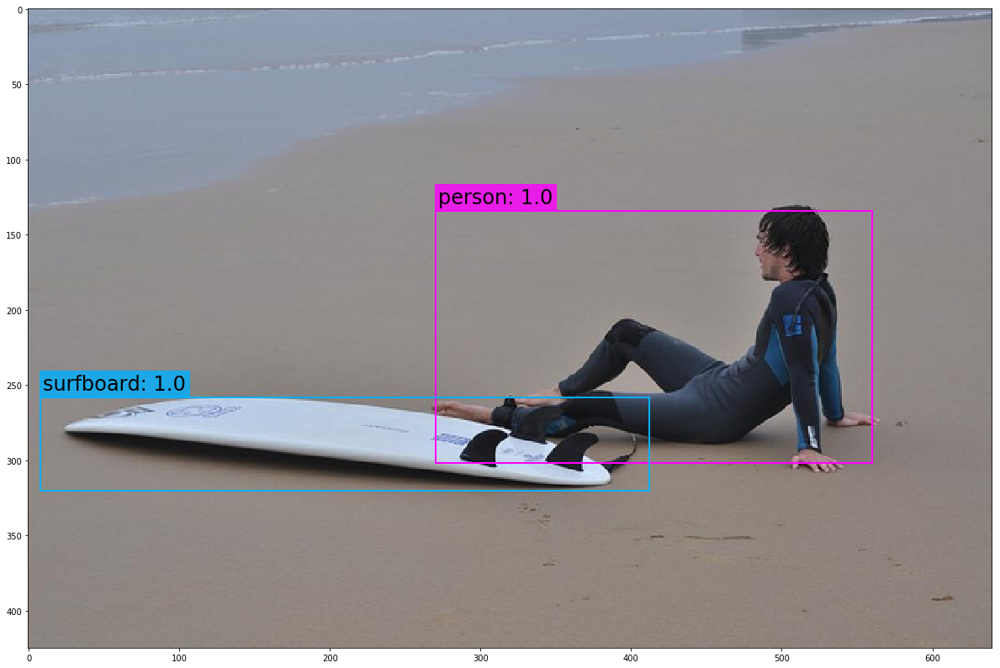

In [14]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [24.0, 14.0]

# Load the image
img = cv2.imread('./images/surf.jpg')

# Convert the image to RGB
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# We resize the image to the input width and height of the first layer of the network.    
resized_image = cv2.resize(original_image, (m.width, m.height))

# Set the IOU threshold. Default value is 0.4
iou_thresh = 0.4

# Set the NMS threshold. Default value is 0.6
nms_thresh = 0.6

# Detect objects in the image
boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)

# Print the objects found and the confidence level
print_objects(boxes, class_names)

#Plot the image with bounding boxes and corresponding object class labels
plot_boxes(original_image, boxes, class_names, plot_labels = True)



It took 2.137 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. person: 1.000000
2. surfboard: 0.994814


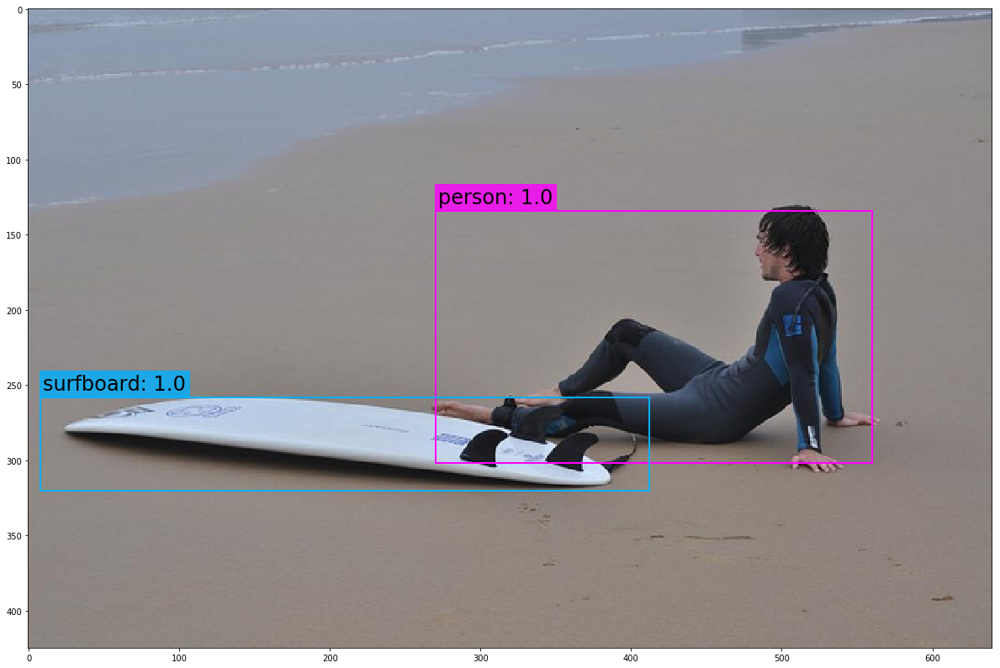

In [15]:
iou_thresh = 0.2
nms_thresh = 0.6
boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)
print_objects(boxes, class_names)
plot_boxes(original_image, boxes, class_names, plot_labels = True)



It took 2.355 seconds to detect the objects in the image.

Number of Objects Detected: 6 

Objects Found and Confidence Level:

1. person: 1.000000
2. surfboard: 0.994814
3. person: 1.000000
4. person: 1.000000
5. person: 0.999999
6. surfboard: 0.915020


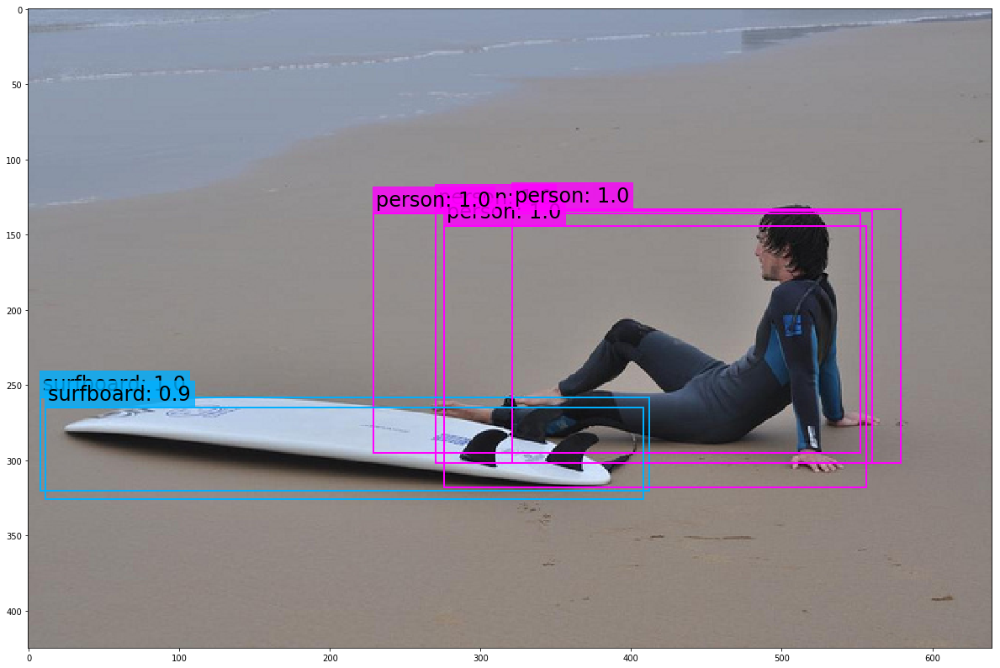

In [17]:
iou_thresh = 1
nms_thresh = 0.6
boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)
print_objects(boxes, class_names)
plot_boxes(original_image, boxes, class_names, plot_labels = True)



It took 2.436 seconds to detect the objects in the image.

Number of Objects Detected: 7 

Objects Found and Confidence Level:

1. person: 1.000000
2. surfboard: 0.994814
3. person: 1.000000
4. person: 1.000000
5. person: 0.999999
6. surfboard: 0.915020
7. surfboard: 0.892148


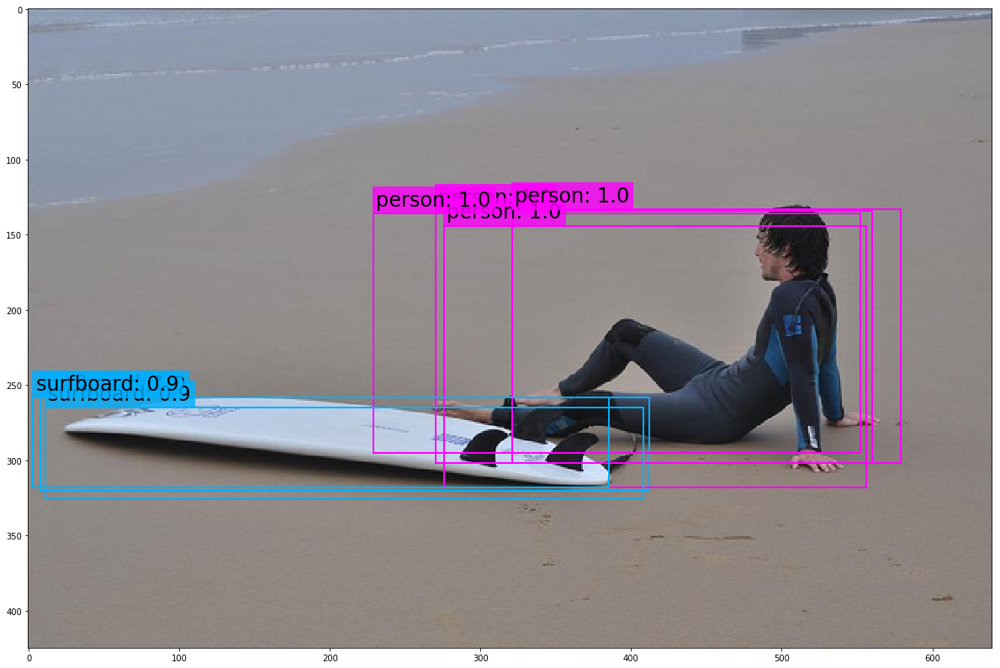

In [18]:
iou_thresh = 1
nms_thresh = 0.2
boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)
print_objects(boxes, class_names)
plot_boxes(original_image, boxes, class_names, plot_labels = True)



It took 2.246 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. cat: 0.999939


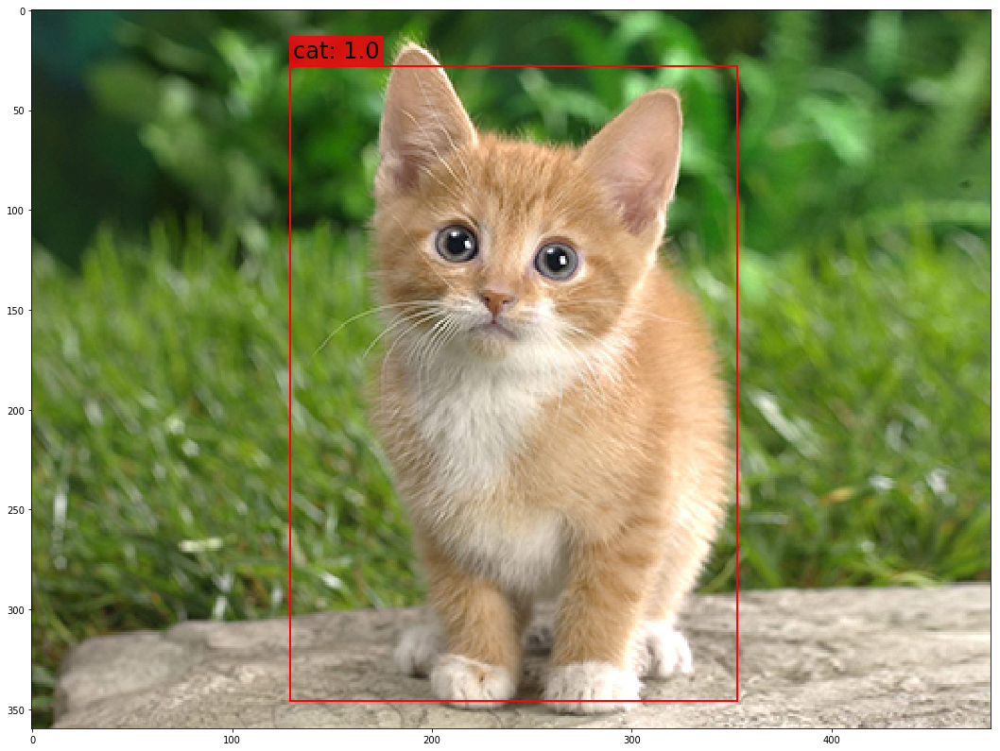



It took 2.140 seconds to detect the objects in the image.

Number of Objects Detected: 28 

Objects Found and Confidence Level:

1. person: 0.999996
2. person: 1.000000
3. truck: 0.949642
4. car: 0.634398
5. car: 0.627129
6. truck: 0.671305
7. traffic light: 1.000000
8. person: 1.000000
9. person: 1.000000
10. car: 0.997258
11. bus: 0.997870
12. person: 1.000000
13. person: 1.000000
14. person: 0.999999
15. person: 1.000000
16. person: 1.000000
17. traffic light: 1.000000
18. traffic light: 1.000000
19. handbag: 0.997166
20. traffic light: 1.000000
21. car: 0.989488
22. traffic light: 1.000000
23. person: 0.999999
24. traffic light: 0.999999
25. traffic light: 1.000000
26. truck: 0.705300
27. person: 0.999993
28. person: 0.999996


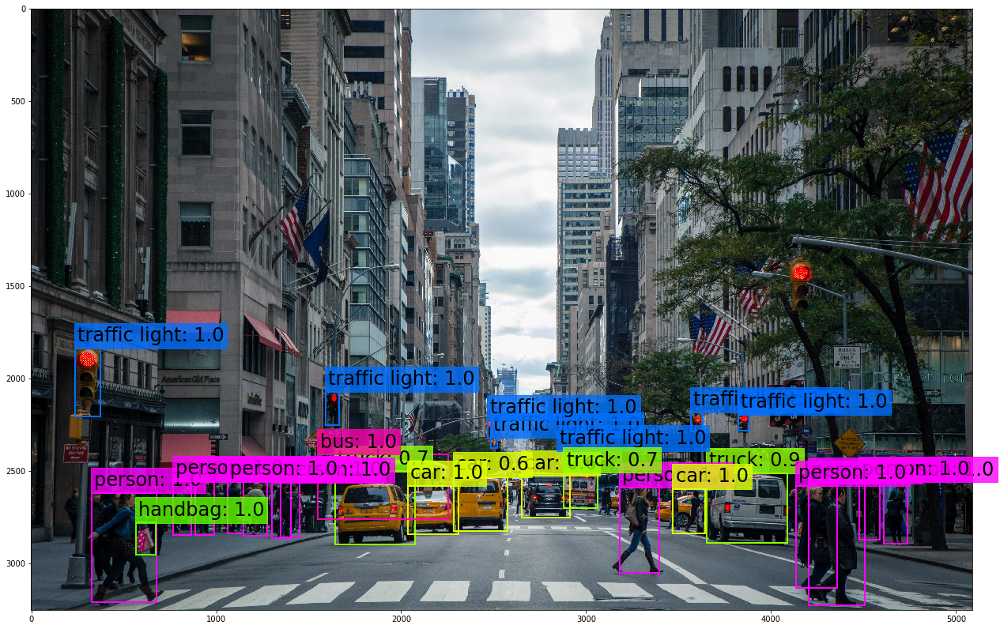



It took 2.122 seconds to detect the objects in the image.

Number of Objects Detected: 4 

Objects Found and Confidence Level:

1. dog: 0.999024
2. bicycle: 0.999822
3. person: 1.000000
4. person: 1.000000


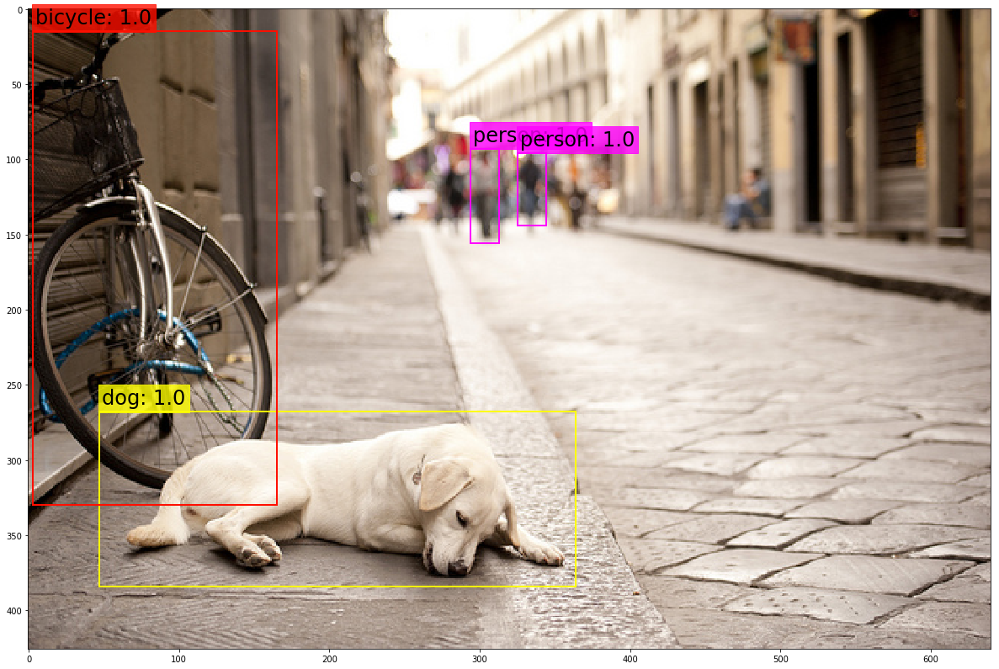



It took 2.077 seconds to detect the objects in the image.

Number of Objects Detected: 3 

Objects Found and Confidence Level:

1. dog: 0.999997
2. truck: 0.991125
3. bicycle: 0.999998


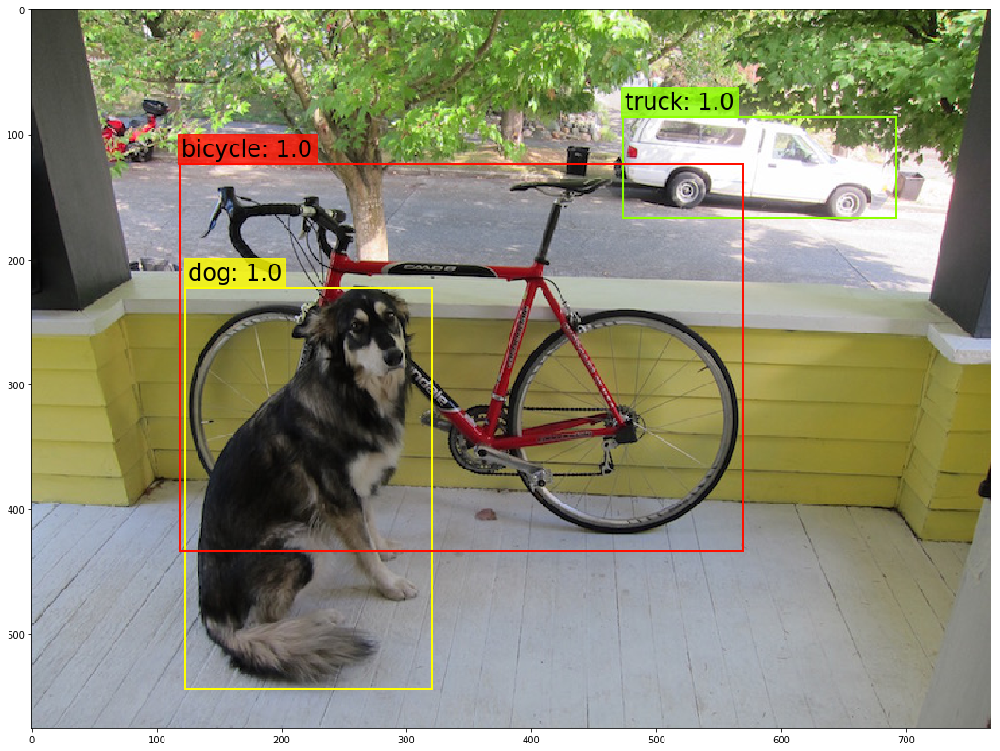



It took 2.081 seconds to detect the objects in the image.

Number of Objects Detected: 1 

Objects Found and Confidence Level:

1. bird: 0.999980


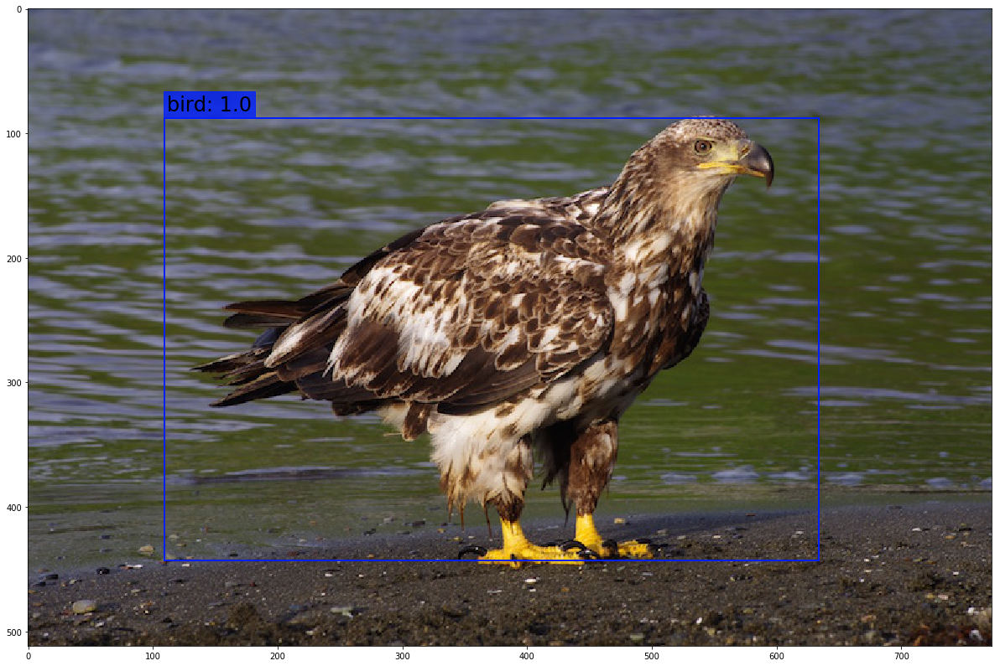



It took 2.110 seconds to detect the objects in the image.

Number of Objects Detected: 17 

Objects Found and Confidence Level:

1. bowl: 0.999978
2. bowl: 0.999683
3. bowl: 0.999968
4. bowl: 0.999995
5. spoon: 0.996659
6. bowl: 0.999998
7. bowl: 0.999983
8. spoon: 0.999949
9. diningtable: 0.999985
10. bowl: 0.999991
11. bowl: 0.999346
12. spoon: 0.999407
13. spoon: 0.943999
14. bowl: 0.999959
15. carrot: 0.999987
16. carrot: 1.000000
17. carrot: 0.999996


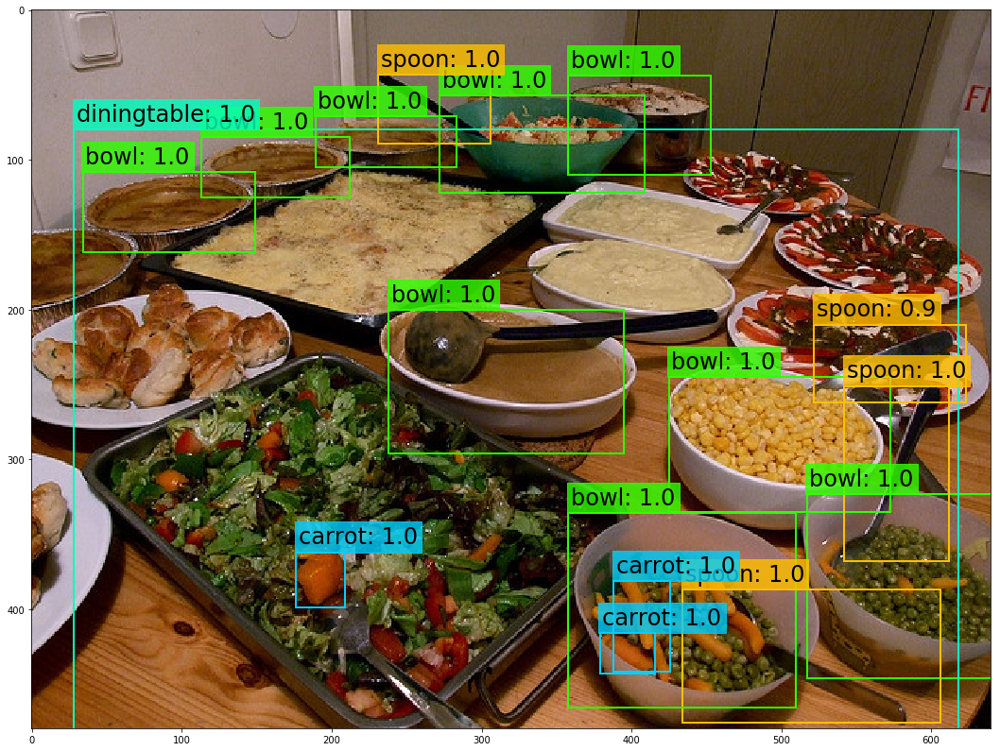



It took 2.111 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. zebra: 0.998162
2. giraffe: 0.999998


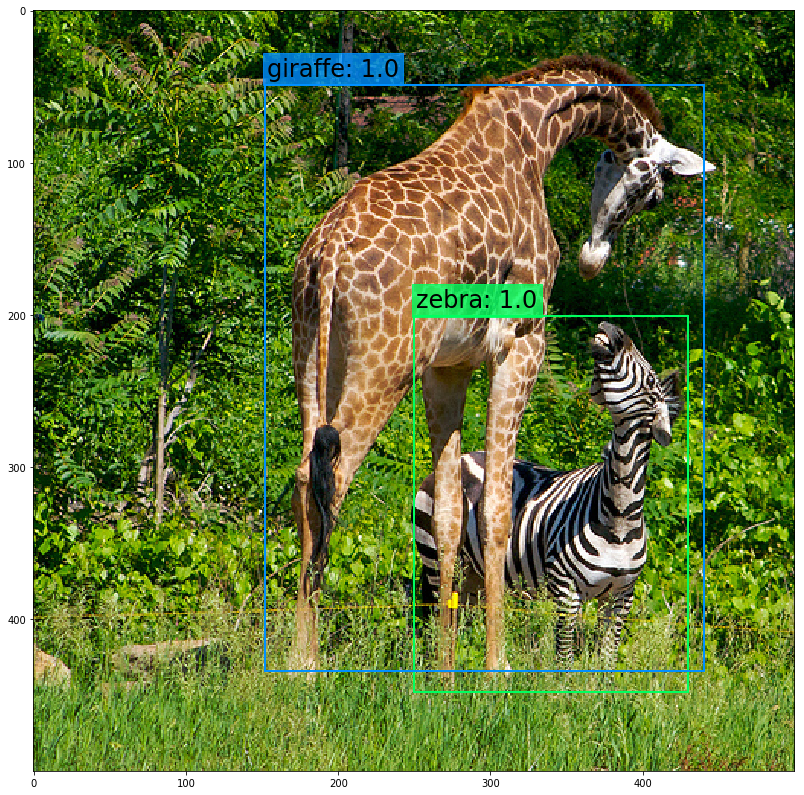



It took 2.108 seconds to detect the objects in the image.

Number of Objects Detected: 4 

Objects Found and Confidence Level:

1. horse: 0.999903
2. horse: 0.997532
3. horse: 0.999994
4. horse: 0.999998


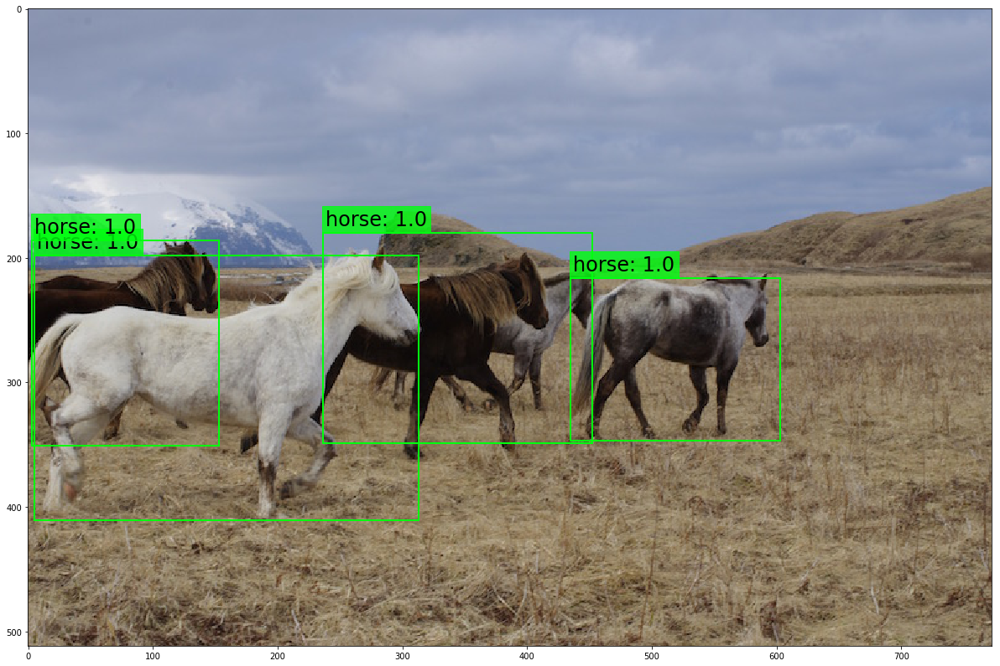



It took 2.099 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. motorbike: 0.999994
2. person: 0.999999


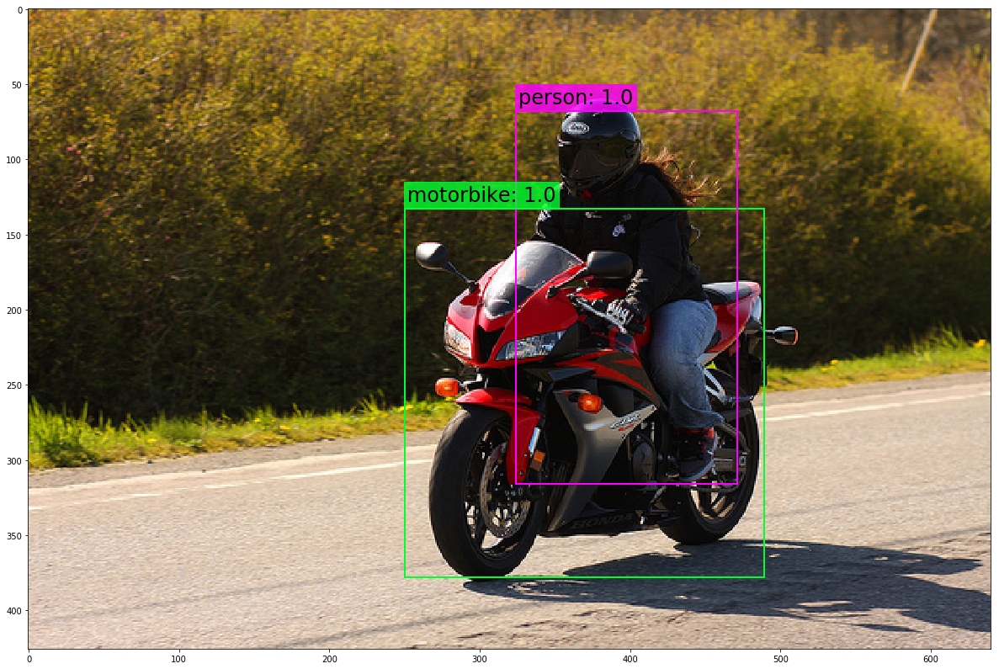



It took 2.079 seconds to detect the objects in the image.

Number of Objects Detected: 3 

Objects Found and Confidence Level:

1. person: 1.000000
2. dog: 0.999986
3. horse: 1.000000


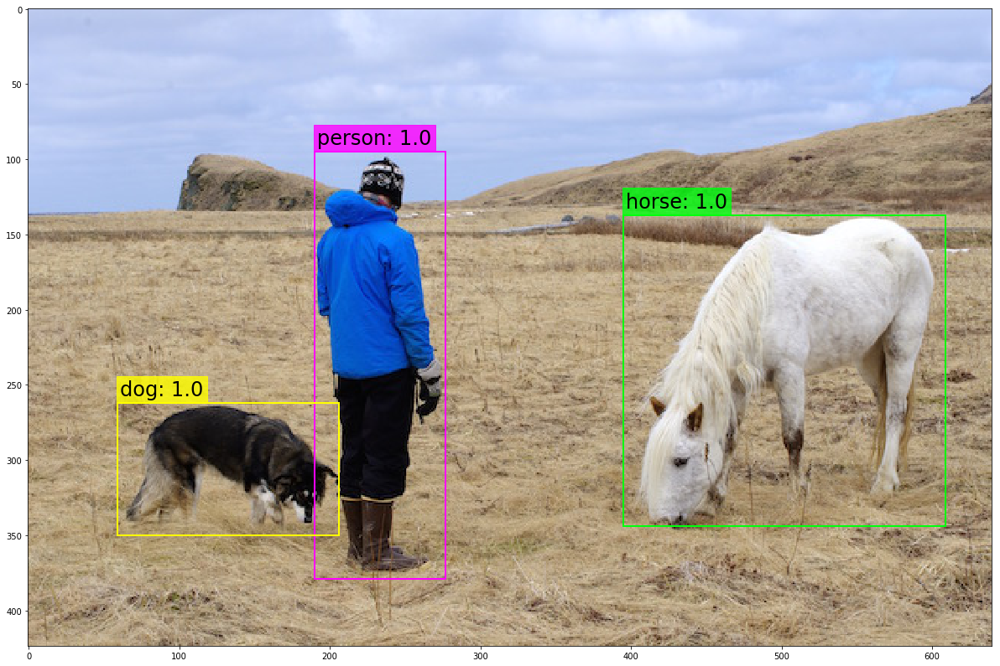



It took 2.067 seconds to detect the objects in the image.

Number of Objects Detected: 2 

Objects Found and Confidence Level:

1. person: 1.000000
2. surfboard: 0.994814


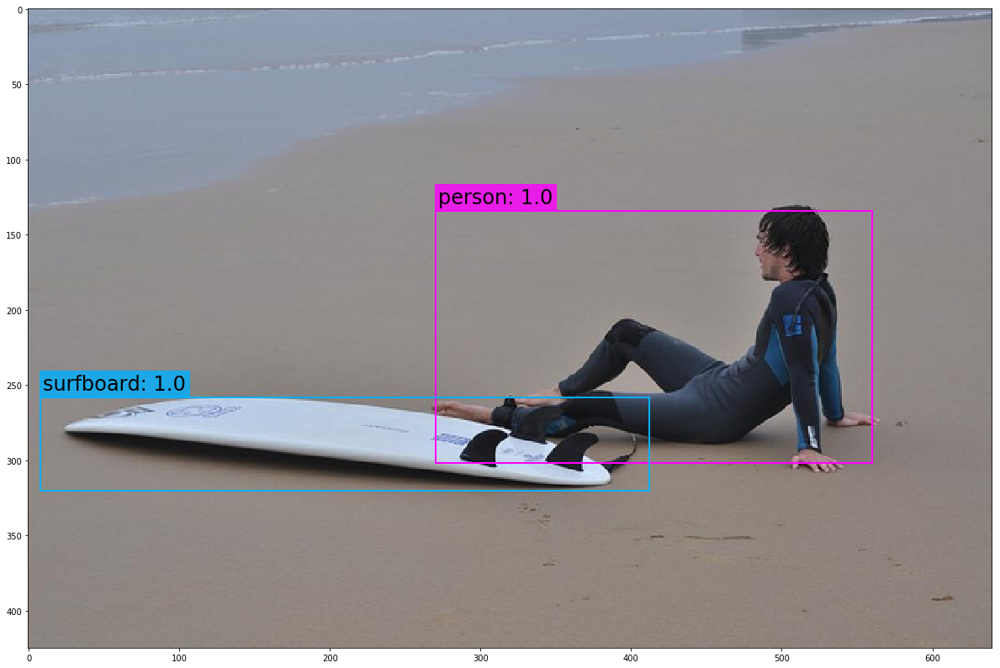



It took 2.166 seconds to detect the objects in the image.

Number of Objects Detected: 3 

Objects Found and Confidence Level:

1. wine glass: 1.000000
2. bottle: 1.000000
3. chair: 0.999748


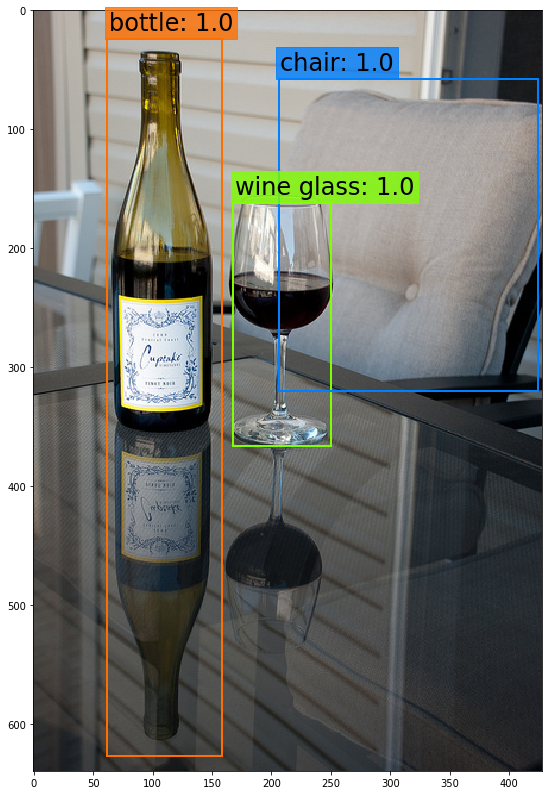

In [20]:
iou_thresh = 0.4
nms_thresh = 0.6

for i in ims:
    img = cv2.imread('./images/'+i)
    original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    resized_image = cv2.resize(original_image, (m.width, m.height))
    boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)
    print_objects(boxes, class_names)
    plot_boxes(original_image, boxes, class_names, plot_labels = True)



It took 2.278 seconds to detect the objects in the image.

Number of Objects Detected: 28 

Objects Found and Confidence Level:

1. person: 0.999996
2. person: 1.000000
3. truck: 0.949642
4. car: 0.634398
5. car: 0.627129
6. truck: 0.671305
7. traffic light: 1.000000
8. person: 1.000000
9. person: 1.000000
10. car: 0.997258
11. bus: 0.997870
12. person: 1.000000
13. person: 1.000000
14. person: 0.999999
15. person: 1.000000
16. person: 1.000000
17. traffic light: 1.000000
18. traffic light: 1.000000
19. handbag: 0.997166
20. traffic light: 1.000000
21. car: 0.989488
22. traffic light: 1.000000
23. person: 0.999999
24. traffic light: 0.999999
25. traffic light: 1.000000
26. truck: 0.705300
27. person: 0.999993
28. person: 0.999996


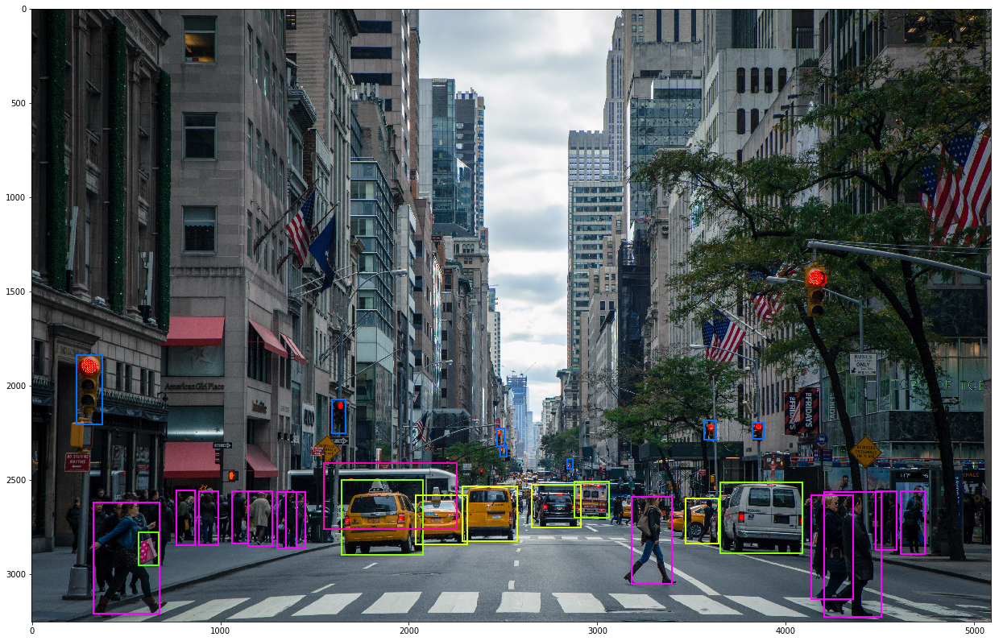

In [22]:
img = cv2.imread('./images/city_scene.jpg')
original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(original_image, (m.width, m.height))
boxes = detect_objects(m, resized_image, iou_thresh, nms_thresh)
print_objects(boxes, class_names)
plot_boxes(original_image, boxes, class_names, plot_labels = False)